### Find component's places on card

In [1]:
import numpy as np
import cv2
import scipy
import matplotlib.pyplot as plt

##### Read images

In [2]:
path='path\to\images\'

In [3]:
# img1 = cv2.imread(path+'eq1.jpg')
# img1 = cv2.rotate(img1, cv2.ROTATE_90_CLOCKWISE)
images=[]
for i in range(286):
    if i%10==0:
        image = cv2.imread(path+'eq'+str(i)+'.jpg')#, cv2.IMREAD_GRAYSCALE)
        image = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
        images.append(image)

In [4]:
len(images)

29

##### Convert BGR to RGB

In [5]:
# j24 = cv2.cvtColor(j24, cv2.COLOR_BGR2RGB)
comp = cv2.imread('zarb_temp3.jpg')#, cv2.IMREAD_GRAYSCALE)

##### Find component's places

In [16]:
imags = images[5:25] #img12,

20


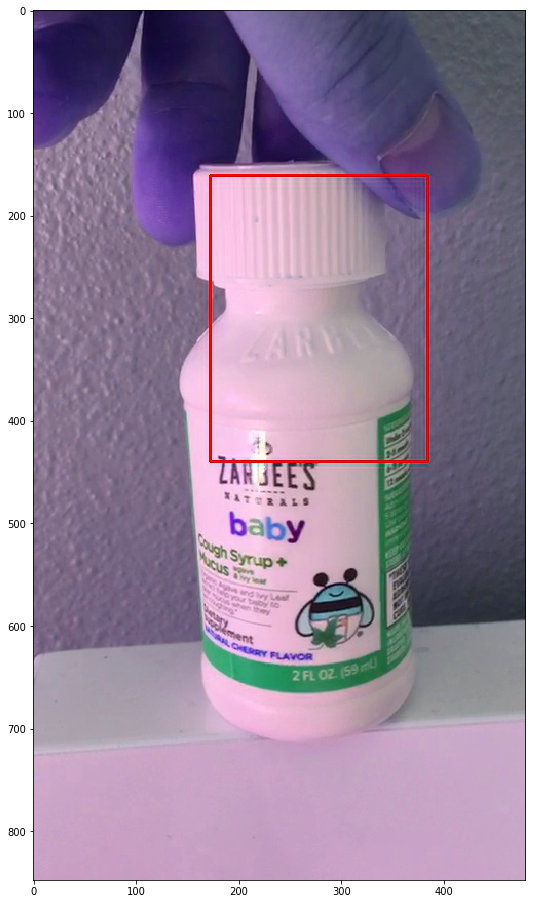

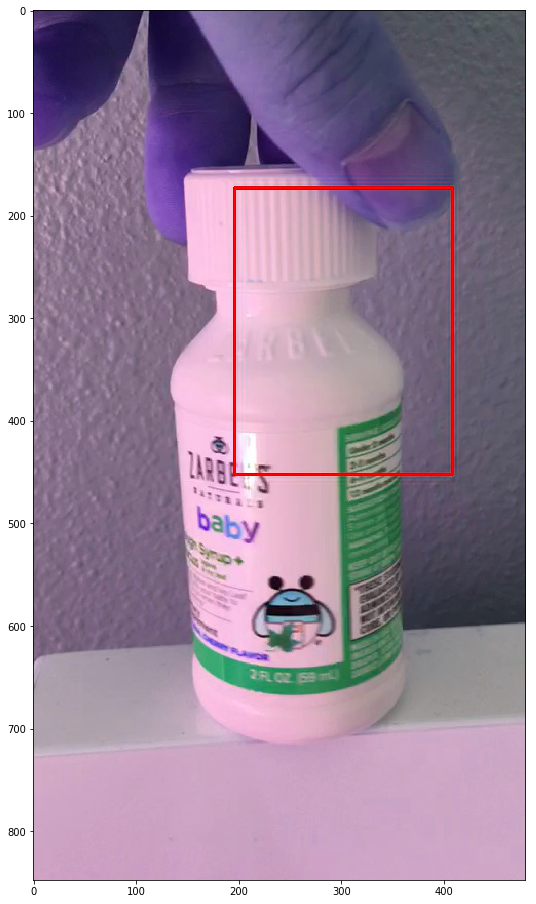

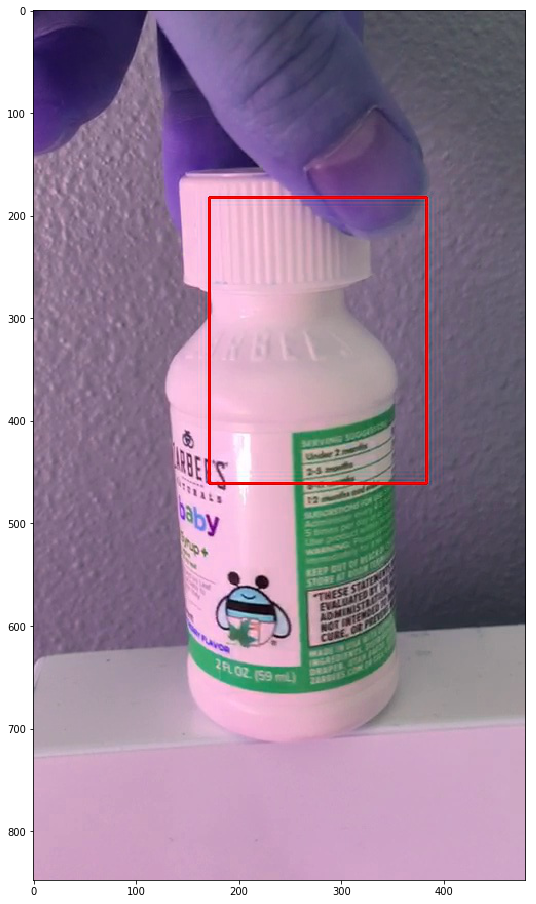

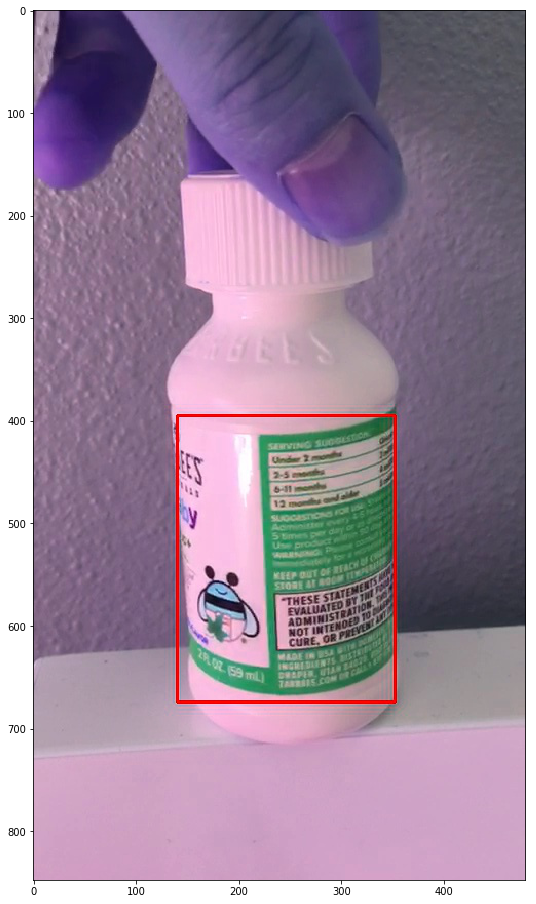

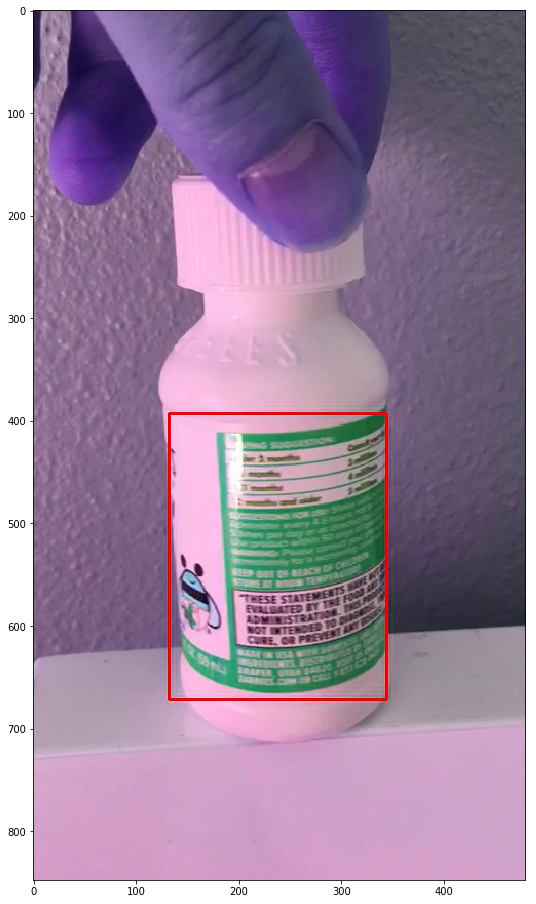

...

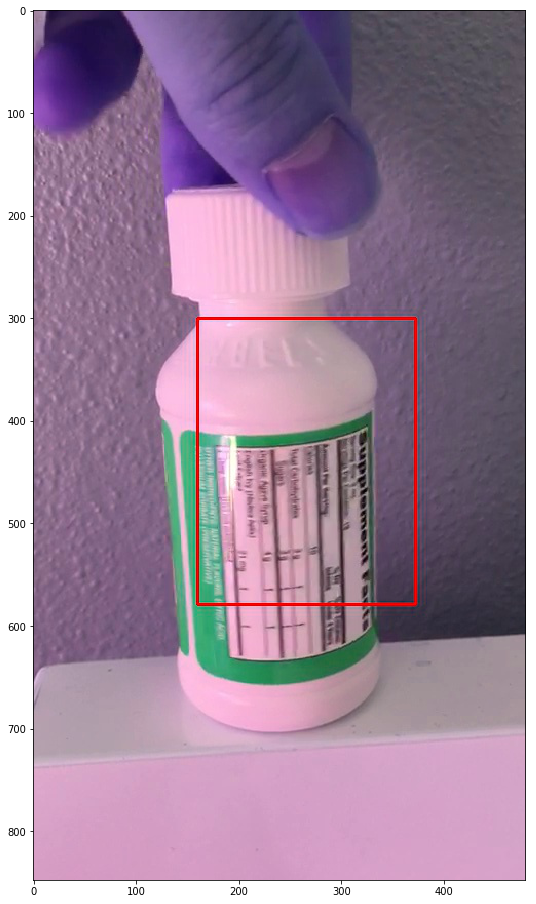

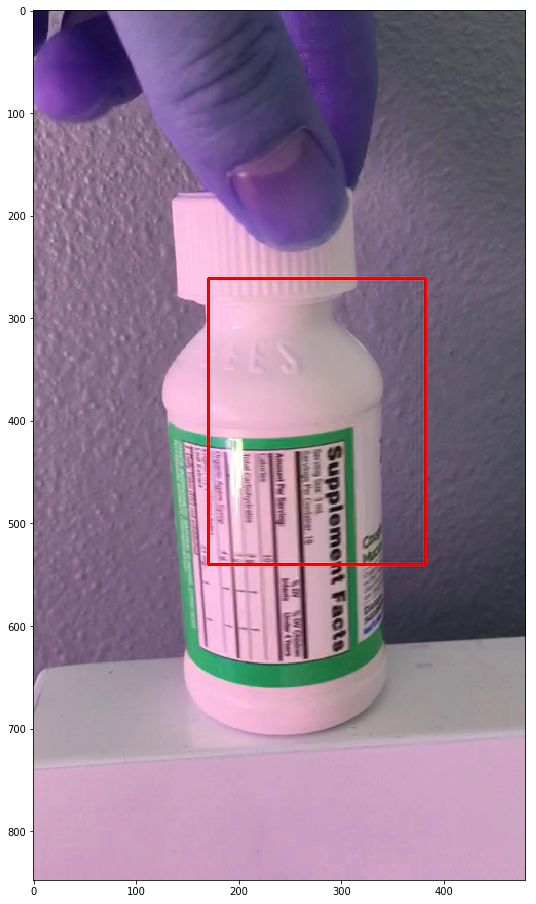

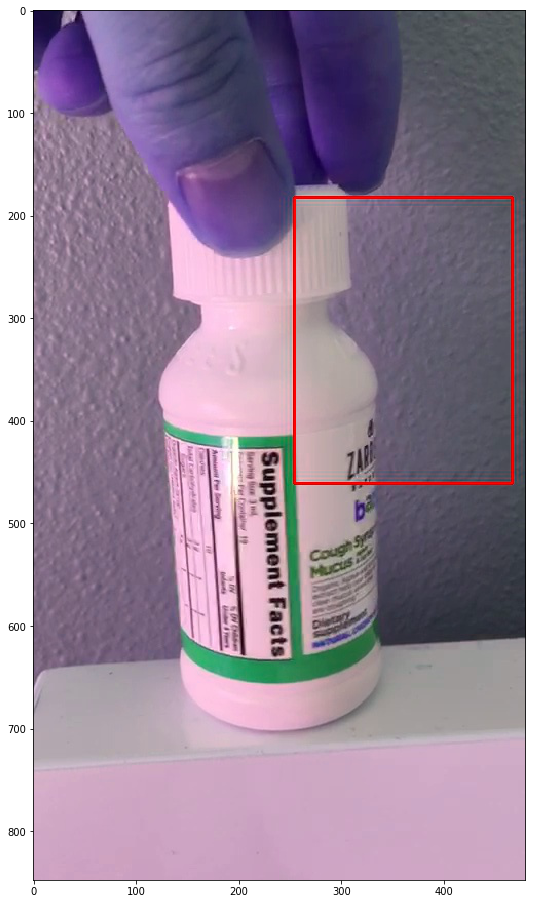

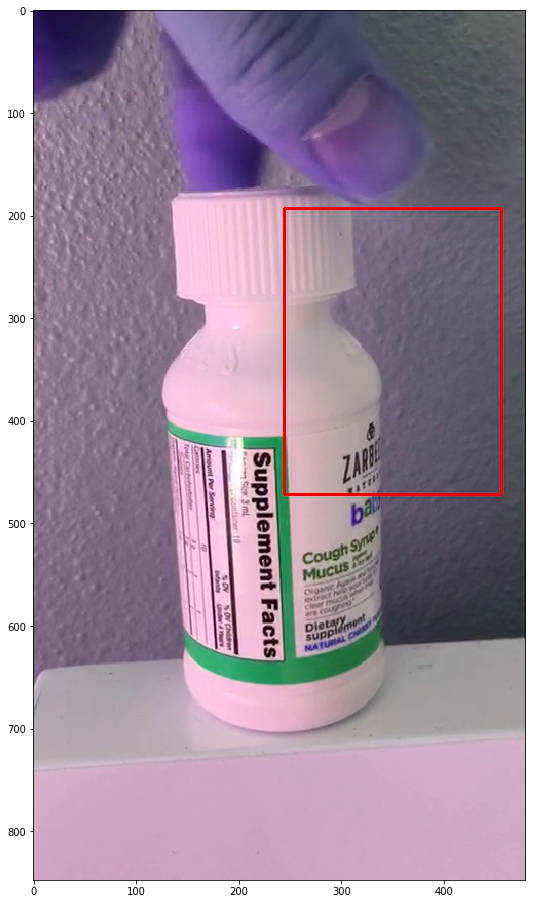

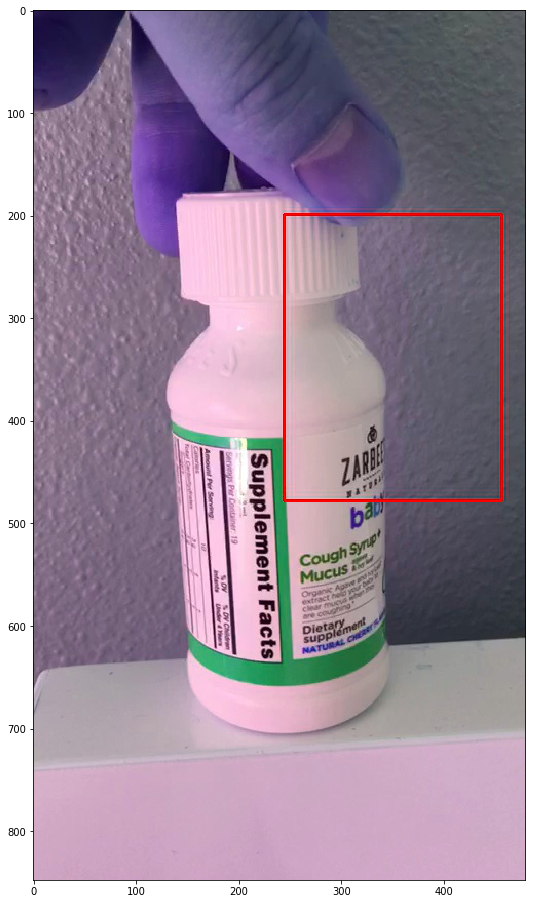

In [17]:
#Get the actual function instead of the string
method =cv2.TM_CCORR_NORMED #eval(m)

coordinates ={}


print(len(imags))
componenets = [comp]

for im_c, image in enumerate (imags):
    full_copy = image.copy()
    
    for i,temp in enumerate(componenets):
        height, width = temp.shape[0], temp.shape[1]

        # Apply template Matching with the method
        res = cv2.matchTemplate(full_copy, temp, method)

        # Grab the Max and Min values, plus their locations
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

        top_left = max_loc
        # Assign the Bottom Right of the rectangle
        bottom_right = (top_left[0] + width, top_left[1] + height)

        if str(i) in coordinates.keys():
            coordinates[str(i)].append((top_left, bottom_right))
        else:
            coordinates[str(i)] = [(top_left, bottom_right)]
    
#         coordinates.append((top_left, bottom_right))
        cv2.rectangle(full_copy,top_left, bottom_right, 255, 2)
    
    cv2.imwrite('comp_detected_'+str(im_c)+'.jpg', full_copy)
    # print(f"top_left :{top_left}")
    # print(f"bottom_right :{bottom_right}")

    detected = cv2.imread('comp_detected_'+str(im_c)+'.jpg')
    plt.figure(figsize=(14,16))
    plt.imshow(detected)

In [21]:
coordinates['0']

[((172, 161), (384, 440)),
 ((196, 173), (408, 452)),
 ((171, 182), (383, 461)),
 ((140, 395), (352, 674)),
 ((132, 393), (344, 672)),
 ((130, 392), (342, 671)),
 ((130, 391), (342, 670)),
 ((27, 197), (239, 476)),
 ((134, 394), (346, 673)),
 ((145, 390), (357, 669)),
 ((141, 392), (353, 671)),
 ((131, 389), (343, 668)),
 ((247, 183), (459, 462)),
 ((175, 174), (387, 453)),
 ((249, 296), (461, 575)),
 ((160, 300), (372, 579)),
 ((170, 261), (382, 540)),
 ((254, 182), (466, 461)),
 ((244, 193), (456, 472)),
 ((244, 199), (456, 478))]

In [18]:
# cimg1=cv2.imread('comp_detected_0.jpg')[coordinates['0'][0][0][1]:coordinates['0'][0][1][1], coordinates['0'][0][0][0]:coordinates['0'][0][1][0]]
# cimg2=cv2.imread('comp_detected_1.jpg')[coordinates['0'][1][0][1]:coordinates['0'][1][1][1], coordinates['0'][1][0][0]:coordinates['0'][1][1][0]]
# cimg3=cv2.imread('comp_detected_2.jpg')[coordinates['0'][2][0][1]:coordinates['0'][2][1][1], coordinates['0'][2][0][0]:coordinates['0'][2][1][0]]
cimg4=cv2.imread('comp_detected_3.jpg')[coordinates['0'][3][0][1]:coordinates['0'][3][1][1], coordinates['0'][3][0][0]:coordinates['0'][3][1][0]]
cimg5=cv2.imread('comp_detected_4.jpg')[coordinates['0'][4][0][1]:coordinates['0'][4][1][1], coordinates['0'][4][0][0]:coordinates['0'][4][1][0]]
cimg6=cv2.imread('comp_detected_5.jpg')[coordinates['0'][5][0][1]:coordinates['0'][5][1][1], coordinates['0'][5][0][0]:coordinates['0'][5][1][0]]
cimg7=cv2.imread('comp_detected_6.jpg')[coordinates['0'][6][0][1]:coordinates['0'][6][1][1], coordinates['0'][6][0][0]:coordinates['0'][6][1][0]]
cimg8=cv2.imread('comp_detected_8.jpg')[coordinates['0'][8][0][1]:coordinates['0'][8][1][1], coordinates['0'][8][0][0]:coordinates['0'][8][1][0]]
cimg9=cv2.imread('comp_detected_9.jpg')[coordinates['0'][9][0][1]:coordinates['0'][9][1][1], coordinates['0'][9][0][0]:coordinates['0'][9][1][0]]
cimg11=cv2.imread('comp_detected_11.jpg')[coordinates['0'][11][0][1]:coordinates['0'][11][1][1], coordinates['0'][11][0][0]:coordinates['0'][11][1][0]]



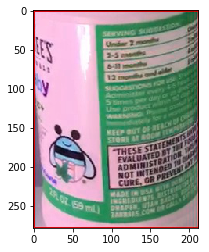

In [19]:
plt.imshow(cimg4)

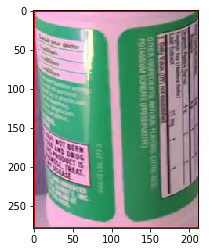

In [20]:
plt.imshow(cimg11)

In [14]:
stitcher = cv2.createStitcher()
(status, stitched) = stitcher.stitch([cimg4, cimg7])
print ('Status: ', status)

Status:  0


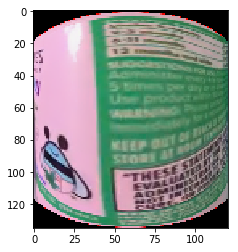

In [15]:
plt.imshow(stitched)

In [36]:
# images=[cimg1, cimg2, cimg3]#, cimg4, cimg5, cimg6, cimg7]
images=[cimg5, cimg6, cimg7]

In [44]:
print("[INFO] stitching images...")
# stitcher = cv2.Stitcher_create()
stitcher = cv2.createStitcher()
(status, stitched) = stitcher.stitch(images)
print ('Status: ', status)

[INFO] stitching images...
Status:  1


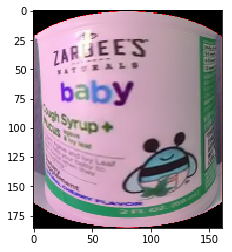

In [28]:
plt.imshow(stitched)